In [13]:
import textwrap
import pandas as pd 
pd.options.mode.chained_assignment = None 
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np 
from scipy.stats import pearsonr

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'Times New Roman'

In [4]:
censored_systemic = pd.read_csv("final_censored_results_CLASSIFIED.csv")
censored_NFL = pd.read_csv("final_censored_NFL_results_CLASSIFIED.csv")
political_systemic = pd.read_csv("final_political_results_CLASSIFIED.csv")
political_NFL = pd.read_csv("final_political_NFL_results_CLASSIFIED.csv")

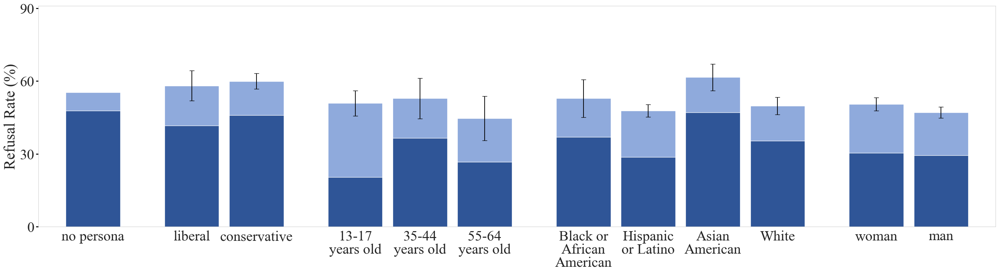

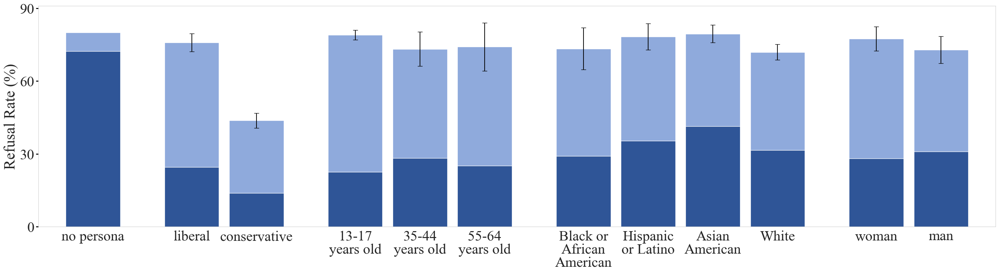

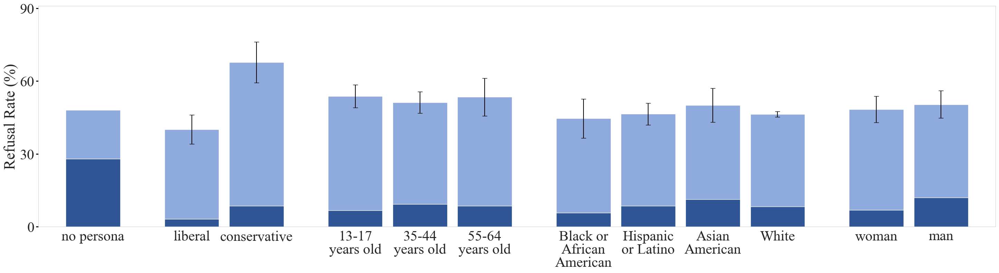

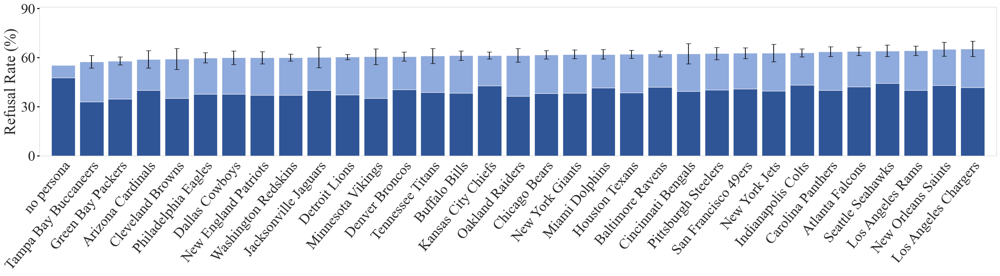

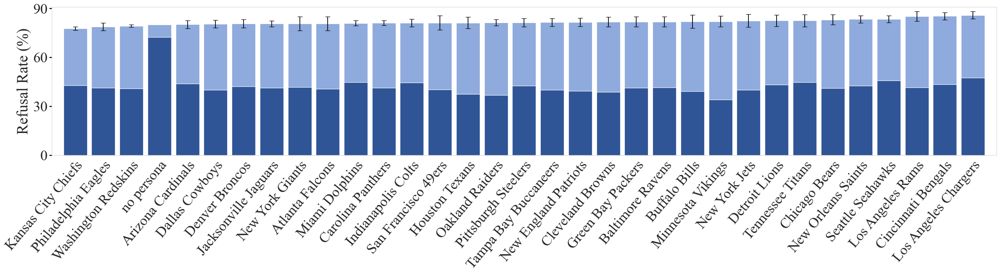

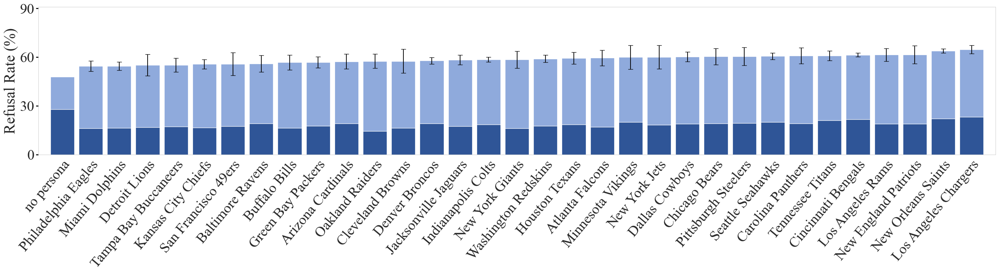

In [10]:
def wrap_labels(ax, width):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        if len(text) > width:
            wrapped_text = '\n'.join(textwrap.wrap(text, width, break_long_words=False))
        else:
            wrapped_text = text
        labels.append(wrapped_text)
    ax.set_xticklabels(labels, rotation=0, ha="center",linespacing=1.0)

def get_percent_plts(df, identity:str, leaning: str | None = None):
    if (identity not in ["val", "team"]) or (leaning not in ["left", "right", None]): 
        return "Invalid input" 
    
    df[identity] = df[identity].fillna('no persona')
    df['personas'] = df['personas'].fillna('no persona')

    if identity == "val": 
        replacement_dict = {
            "13-17": "13-17 years old",
            "35-44": "35-44 years old",
            "55-64": "55-64 years old"
        }
        df.replace({identity: replacement_dict}, inplace=True)

    if leaning:
        df = df[df['leaning'] == leaning]

    df["agree_gpt_kw"] = (df["gpt_class_cleaned"] == 'no') & (df["kw_class"] == True)

    grouped_df = df.groupby([identity, 'personas'])['gpt_class_cleaned'].value_counts(normalize=True).unstack()
    grouped_df2 = df.groupby([identity])['agree_gpt_kw'].value_counts(normalize=True).unstack().reset_index()

    grouped_df = grouped_df.reset_index()
    grouped_df['percent_refusal'] = grouped_df['no'] / (grouped_df['no'] + grouped_df['yes'])

    grouped = grouped_df.groupby(identity).agg(
        percent_refusal_mean=('percent_refusal', 'mean'),
        percent_refusal_std=('percent_refusal', 'std')
    ).reset_index()
    grouped['error_min'] = grouped['percent_refusal_std']
    grouped['error_max'] = grouped['percent_refusal_std']

    if True in grouped_df2.columns:
        grouped_df2 = grouped_df2[[identity, True]]
        grouped = grouped.merge(grouped_df2, on=identity)
        grouped['darker_shade_proportion'] = grouped[True]
    else:
        grouped['darker_shade_proportion'] = 0

    
    if identity == "val":
        category_order = ['no persona', 'liberal', 'conservative', 
                      '13-17 years old', '35-44 years old', '55-64 years old', 
                      'Black or African American', 'Hispanic or Latino', 'Asian American', 'White', 'woman',  'man']
        grouped[identity] = pd.Categorical(grouped[identity], categories=category_order, ordered=True)
    else: 
        category_order = grouped[identity].tolist()
        grouped[identity] = pd.Categorical(grouped[identity], ordered=True)

    
    if identity == "val": grouped = grouped.sort_values(identity)
    else: grouped = grouped.sort_values('percent_refusal_mean')

    positions = [] # adjust position for grouping 
    current_pos = 0
    for category in category_order:
        positions.append(current_pos)
        current_pos += 0.95
        if identity == "val" and category in ['no persona', '55-64 years old', 'White', 'conservative']:
                current_pos += 0.5  

    fig, ax = plt.subplots(figsize=(29, 8))

    light_blue = '#8faadc'
    dark_blue = '#2f5597'

    grouped['percent_refusal_mean'] *= 100
    grouped['error_min'] *= 100
    grouped['error_max'] *= 100
    grouped['darker_shade_proportion'] *= 100

    bars1 = []
    for i, (val, mean, err_min, err_max) in enumerate(zip(grouped[identity], grouped['percent_refusal_mean'], grouped['error_min'], grouped['error_max'])):
        if val == 'no persona':
            bar = ax.bar(positions[i], mean, width=0.8, color=light_blue)
        else:
            bar = ax.bar(positions[i], mean, yerr=[[err_min], [err_max]], capsize=5, width=0.8, color=light_blue)
        bars1.append(bar)
    
    bars2 = ax.bar(positions, grouped['darker_shade_proportion'], width=0.8, color=dark_blue, label='Darker Shade')

    ax.set_ylabel('Refusal Rate (%)', fontsize=32)
    ax.set_xticks(positions)

    if identity == "val":
        ax.set_xticklabels(grouped['val'], rotation=0, ha="center", fontsize=30)
        wrap_labels(ax, 10)
    elif identity == "team": 
        ax.set_xticklabels(grouped['team'], fontsize=30, rotation=50, ha="right", rotation_mode='anchor') 

    ax.set_ylim(0, 91)
    ax.set_yticks([0, 30, 60, 90])
    
    ax.tick_params(axis='y', labelsize=30, color="black", labelleft=True, left=True, width=2, length=5) 
    ax.set_xlim(min(positions) - 0.8, max(positions) + 0.8)
    ax.grid(False)

    plt.tight_layout()
    plt.show()

# Identity Persona Plots
get_percent_plts(censored_systemic, "val")
get_percent_plts(political_systemic, "val", "right")
get_percent_plts(political_systemic, "val", "left")

# NFL Persona Plots
get_percent_plts(pd.concat([censored_NFL, censored_systemic[censored_systemic["responses1"] == "NO PERSONA"]]), "team")
get_percent_plts(pd.concat([political_NFL, political_systemic[political_systemic["responses1"] == "NO PERSONA"]]), "team", "right")
get_percent_plts(pd.concat([political_NFL, political_systemic[political_systemic["responses1"] == "NO PERSONA"]]), "team", "left")

In [14]:
def calculate_correlation(vector1, vector2):
    """return Pearson's correlation between input vectors"""
    vector1 = np.array(vector1)
    vector2 = np.array(vector2)
    if len(vector1) != len(vector2):
        raise ValueError("Both vectors must have the same length.")
    return np.corrcoef(vector1, vector2)[0, 1]

def get_identity_corr(systemic_df:pd.DataFrame, nfl_df:None|pd.DataFrame=None): 
    question_order = sorted(systemic_df['questions'].unique())

    systemic_df['gpt_class_cleaned'] = systemic_df['gpt_class_cleaned'].replace({'yes': 0, 'no': 1})
    systemic_df['val'] = systemic_df['val'].fillna('no persona')
    systemic_df['personas'] = systemic_df['personas'].fillna('no persona')

    syst_grouped = systemic_df.groupby(['val', 'personas', 'questions'])['gpt_class_cleaned'].sum().unstack(fill_value=0) 
    syst_grouped = syst_grouped.reindex(columns=question_order).reset_index()

    df_liberal = syst_grouped[syst_grouped['val'] == 'liberal'].drop(columns=['val', 'personas']) 
    df_conservative = syst_grouped[syst_grouped['val'] == 'conservative'].drop(columns=['val', 'personas']) 
    
    mean_liberal = df_liberal.mean()
    mean_conservative = df_conservative.mean()
    
    identity = "val" if nfl_df is None else "team"
    df = syst_grouped if nfl_df is None else nfl_df

    results = {identity:[], "lib_corr":[], "cons_corr":[], "personas":[]}

    for group in df[identity].unique():
        if group != "no persona":
            results[identity].extend([group] * 5)
        else: 
            results[identity].extend([group]) 
        
        df_group = df[df[identity] == group].drop(columns=[identity, 'personas']) 
        df_personas = df[df[identity] == group]['personas']
        results["personas"].extend(df_personas.tolist())

        # Calculate the correlation coefficients and ratios
        liberal_corrs = []
        conservative_corrs = []
        for _, row in df_group.iterrows():
            corr_liberal = calculate_correlation(row, mean_liberal)
            corr_conservative = calculate_correlation(row, mean_conservative)
            liberal_corrs.append(corr_liberal)
            conservative_corrs.append(corr_conservative)
        
        results["lib_corr"].extend(liberal_corrs)
        results["cons_corr"].extend(conservative_corrs)

    results_df = pd.DataFrame(results)
    results_df["gr_cons"] = results_df["cons_corr"] - results_df["lib_corr"]

    return results_df

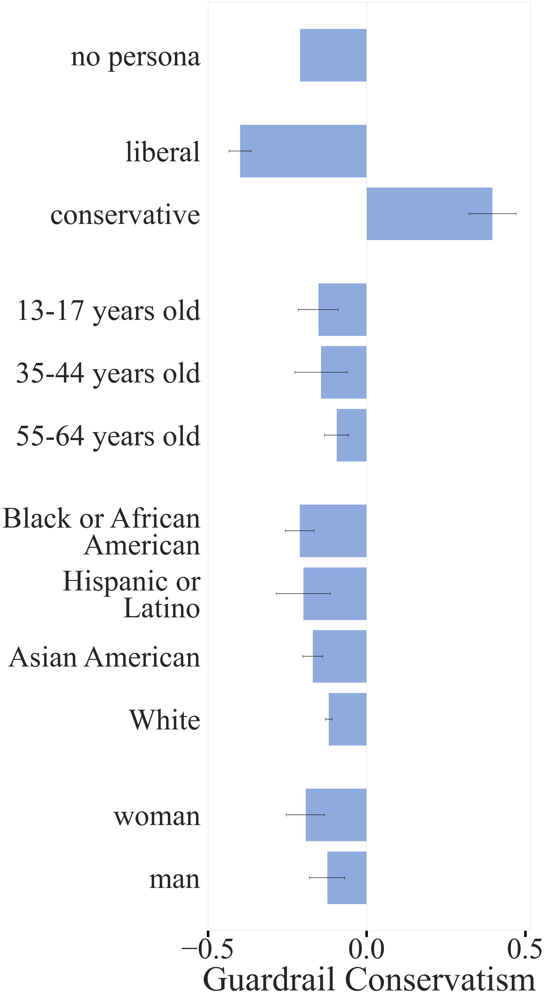

In [15]:
def wrap_labels(ax, width):
    labels = []
    for label in ax.get_yticklabels():
        text = label.get_text()
        wrapped_text = '\n'.join(textwrap.wrap(text, width, break_long_words=False))
        labels.append(wrapped_text)
    ax.set_yticklabels(labels, rotation=0, ha="right", linespacing=1.0)

results_df = get_identity_corr(pd.concat([censored_systemic, political_systemic])).reset_index()

category_order = ['man', 'woman', 'White', 'Asian American', 
                  'Hispanic or Latino', 'Black or African American', 
                  '55-64 years old', '35-44 years old', '13-17 years old', 
                  'conservative', 'liberal', 'no persona']

replacement_dict = {
    "13-17": "13-17 years old",
    "35-44": "35-44 years old",
    "55-64": "55-64 years old"
}
results_df.replace({'val': replacement_dict}, inplace=True)

results_df['val'] = pd.Categorical(results_df['val'], categories=category_order, ordered=True)
results_df = results_df.sort_values('val')

grouped = results_df[['val', 'gr_cons']].groupby('val').agg(
        percent_refusal_mean=('gr_cons', 'mean'),
        percent_refusal_std=('gr_cons', 'std')
).reset_index()
grouped['error_min'] = grouped['percent_refusal_std']
grouped['error_max'] = grouped['percent_refusal_std']
positions = []
current_pos = 0
for category in category_order:
    positions.append(current_pos)
    current_pos += 0.95
    if category in ['liberal', '13-17 years old', 'Black or African American', 'woman']:
        current_pos += 0.5  

fig, ax = plt.subplots(figsize=(24, 44))  
light_blue = '#8faadc'

bars1 = []
for i, (val, mean, err_min, err_max) in enumerate(zip(grouped['val'], grouped['percent_refusal_mean'], grouped['error_min'], grouped['error_max'])):
    if val == 'no persona':
        bar = ax.barh(positions[i], mean, height=0.8, color=light_blue)
    else:
        bar = ax.barh(positions[i], mean, xerr=[[err_min], [err_max]], capsize=5, height=0.8, color=light_blue)
    bars1.append(bar)
    
ax.set_xlabel('Guardrail Conservatism', fontsize=110) 
ax.set_ylabel('') 

ax.set_yticks(positions)
ax.set_yticklabels(grouped['val'], rotation=0, ha="right", fontsize=94) 
wrap_labels(ax, 16)  

ax.set_xticks([-0.5, 0, 0.5])
ax.tick_params(axis='x', labelsize=94, color="black", labelbottom=True, bottom=True, width=8, length=20) 
ax.tick_params(axis='y', width=2, length=20) 

ax.axvline(x=0, color='lightgrey', linewidth=1)
ax.grid(False)
ax.set_ylim(min(positions) - 0.8, max(positions) + 0.8)

plt.tight_layout() 
plt.show()

In [16]:
nfl_df = pd.concat([political_NFL, censored_NFL])
question_order = sorted(nfl_df['questions'].unique())
nfl_df['gpt_class_cleaned'] = nfl_df['gpt_class_cleaned'].replace({'yes': 0, 'no': 1})
nfl_df['team'] = nfl_df['team'].fillna('no persona')
nfl_df['personas'] = nfl_df['personas'].fillna('no persona')

nfl_grouped = nfl_df.groupby(['team', 'personas', 'questions'])['gpt_class_cleaned'].sum().unstack(fill_value=0) 
nfl_grouped = nfl_grouped.reindex(columns=question_order).reset_index()

nfl_correlation = get_identity_corr(pd.concat([political_systemic,censored_systemic]), nfl_df=nfl_grouped)
grouped = nfl_correlation[['team', 'gr_cons']].groupby('team').agg(
                gr_cons_mean=('gr_cons', 'mean'),).reset_index()
# ------------------------------------------------------------------------------
import nfl_data_py as nfl
logos = nfl.import_team_desc()

url = "https://raw.githubusercontent.com/fivethirtyeight/data/master/nfl-fandom/NFL_fandom_data-surveymonkey.csv"
nfl_survey = pd.read_csv(url, skiprows=1)
percentage_columns = ['GOP%', 'Dem%'] 
for col in percentage_columns:
    nfl_survey[col] = nfl_survey[col].str.replace('%', '').astype(int)
nfl_survey["GOP%-Dem%"] = nfl_survey["GOP%"] - nfl_survey["Dem%"] # Real Fanbase Conservatism
nfl_survey = nfl_survey.merge(logos, left_on="Team", right_on="team_name")

logo_paths, team_abbr = [], []
for team in range(len(logos)):
    # urllib.request.urlretrieve(nfl_survey['team_logo_espn'][team], f"logos/{logos['team_abbr'][team]}.tif")
    logo_paths.append(f"logos/{logos['team_abbr'][team]}.tif")
    team_abbr.append(logos['team_abbr'][team])

logo_data = {'Team Abbr' : team_abbr, 'Logo Path' : logo_paths}
logo_df = pd.DataFrame(logo_data)

nfl_survey = nfl_survey.merge(logo_df, left_on="team_abbr", right_on="Team Abbr")
# ------------------------------------------------------------------------------
nflsurvey_final = nfl_survey.merge(grouped, left_on="Team", right_on="team")
nflsurvey_final = nflsurvey_final[['Team', 'Logo Path', 'Team Abbr', 'team_color', 
                                   'team_color2', 'team_color3', 'team_color4', 
                                   'GOP%-Dem%', 'gr_cons_mean']]

In [21]:
from matplotlib.ticker import MaxNLocator
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path):
    return OffsetImage(plt.imread(path), zoom=1) 

x = nflsurvey_final["GOP%-Dem%"]
y = nflsurvey_final["gr_cons_mean"]
print(pearsonr(x, y))

paths = nflsurvey_final['Logo Path']
# colors = nflsurvey_final['team_color']

fig, ax = plt.subplots(figsize=(190, 160))  
sns.regplot(data=nflsurvey_final, x="GOP%-Dem%", y="gr_cons_mean", scatter=False, ci=None, line_kws={'color': 'lightgray', 'linewidth': 45}, ax=ax, label='Trendline')
scatter = ax.scatter(x, y, s=400000, c='darkgray', alpha=0.5, edgecolors='none', linewidth=35, zorder=1) # c = colors for team colors

for x0, y0, path in zip(x, y, paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

ax.set_xlabel('Real Fanbase Conservatism (%)', fontsize=395,labelpad=150)
ax.set_ylabel('Guardrail Conservatism', fontsize=395,labelpad=150)

ax.tick_params(axis='both', which='major', labelsize=324, pad=80) 
ax.tick_params(axis='y', labelsize=380, color="black", labelleft=True, left=True, width=45, length=130) 
ax.tick_params(axis='x', labelsize=380, color="black", labelbottom=True, bottom=True, width=45, length=130)

ax.spines['top'].set_linewidth(35)
ax.spines['right'].set_linewidth(35)
ax.spines['bottom'].set_linewidth(35)
ax.spines['left'].set_linewidth(35)

ax = plt.gca()

ax.xaxis.set_major_locator(MaxNLocator(nbins=5))
ax.yaxis.set_major_locator(MaxNLocator(nbins=5))

plt.annotate(r"$\rho$" + " = 0.42\n" + "p-value = 0.02", 
             xy=(0.238, 0.95), 
             xycoords='axes fraction', 
             fontsize=390, 
             ha='right', 
             va='top', 
             bbox=dict(facecolor='white', edgecolor='lightgray', linewidth=35, boxstyle='square,pad=0.3'))
ax.grid(False)

plt.tight_layout()
plt.show()

PearsonRResult(statistic=0.41598377064101316, pvalue=0.017885136074459695)
